# PyCaret Anomaly Detection Tutorial

**Dataset:** Credit Card Fraud Detection  
**Source:** Kaggle - European Credit Card Transactions  
**Task:** Detect fraudulent transactions using unsupervised anomaly detection

---

## What is Anomaly Detection?

Anomaly detection identifies rare items, events, or observations that differ significantly from the majority of the data. This tutorial demonstrates:

- **Isolation Forest** - Tree-based anomaly detection
- **K-Nearest Neighbors** - Distance-based detection  
- **Local Outlier Factor** - Density-based detection
- **One-Class SVM** - Support vector-based detection

---

## Environment Setup

In [1]:
# Verify environment
import sys
print(f"Python version: {sys.version}")

import pycaret
print(f"PyCaret version: {pycaret.__version__}")

Python version: 3.11.11 (main, Feb 12 2025, 15:06:01) [Clang 19.1.6 ]
PyCaret version: 3.3.2


## Load Dataset

The Credit Card Fraud dataset contains transactions made by European cardholders in September 2013.  
Features V1-V28 are PCA transformations to protect user identities.

In [ ]:
import pandas as pdimport numpy as npfrom pathlib import Path# Setup data directorydata_dir = Path('../datasets/anomaly')data_dir.mkdir(parents=True, exist_ok=True)data_path = data_dir / 'creditcard.csv'# Download from Kaggle if not already presentif not data_path.exists():    print(f"📥 Downloading dataset from Kaggle...")        # Check for Kaggle credentials    kaggle_json = Path.home() / '.kaggle' / 'kaggle.json'        if not kaggle_json.exists():        print("⚠️  Kaggle credentials not found!")        print("\nTo download datasets automatically, you need Kaggle API credentials:")        print("1. Go to https://www.kaggle.com/settings")        print("2. Scroll to 'API' section and click 'Create New API Token'")        print("3. This downloads kaggle.json")        print("4. Place it in ~/.kaggle/kaggle.json")        print("   mkdir -p ~/.kaggle && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json")        raise Exception("Please set up Kaggle credentials to download the dataset")    else:        # Download using Kaggle API        import kaggle        print(f"Downloading from Kaggle: mlg-ulb/creditcardfraud")        kaggle.api.dataset_download_files(            'mlg-ulb/creditcardfraud',            path=data_dir,            unzip=True,            quiet=False        )        print(f"✅ Dataset downloaded to {data_dir}")else:    print(f"✅ Dataset already exists at {data_path}")# Load the dataprint(f"\n📊 Loading dataset...")df = pd.read_csv(data_path)print(f"Dataset shape: {df.shape}")print(f"\nFeatures: {df.columns.tolist()}")df.head()# OPTIMIZATION: Sample dataset for faster execution# Keep 50,000 rows (stratified by Class to preserve fraud ratio)if len(df) > 50000:    from sklearn.model_selection import train_test_split    print(f"\n⚡ Sampling dataset from {len(df):,} to 50,000 rows for faster execution...")    df, _ = train_test_split(        df,        train_size=50000,        stratify=df["Class"] if "Class" in df.columns else None,        random_state=42    )    print(f"✅ Sampled dataset shape: {df.shape}")    if "Class" in df.columns:        fraud_ratio = df["Class"].mean()    print(f"   Fraud ratio preserved: {fraud_ratio:.4f}")

In [3]:
# Check class distribution
print("Class distribution:")
print(df['Class'].value_counts())
print(f"\nFraud percentage: {df['Class'].mean() * 100:.3f}%")

Class distribution:
Class
0    284315
1       492
Name: count, dtype: int64

Fraud percentage: 0.173%


## Data Preprocessing

For anomaly detection, we'll:
- Remove the 'Class' column (since this is unsupervised learning)
- Use a sample for faster training (optional)
- Keep Time and Amount features along with V1-V28

In [4]:
# For faster training, you can sample the data
# Uncomment the next line to use a sample
# df = df.sample(n=50000, random_state=42)

# Store actual labels for evaluation (not used in training)
actual_labels = df['Class'].copy()

# Remove the target column for unsupervised learning
df_unsupervised = df.drop('Class', axis=1)

print(f"Training data shape: {df_unsupervised.shape}")
df_unsupervised.head()

Training data shape: (284807, 30)


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99


## PyCaret Setup

Initialize the anomaly detection environment with PyCaret.

In [5]:
from pycaret.anomaly import *

# Setup anomaly detection
anomaly_setup = setup(
    data=df_unsupervised,
    session_id=42,
    normalize=True,  # Normalize features for better detection
    verbose=True
)

,Description,Value
0,Session id,42
1,Original data shape,"(284807, 30)"
2,Transformed data shape,"(284807, 30)"
3,Numeric features,30
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,Normalize,True
9,Normalize method,zscore


## Model Training

Let's create and compare multiple anomaly detection models.

### 1. Isolation Forest

Isolation Forest isolates anomalies by randomly selecting features and split values.

In [6]:
# Create Isolation Forest model
# fraction parameter is the expected proportion of outliers (0.002 = 0.2%)
iforest = create_model(
    'iforest',
    fraction=0.002  # Adjust based on known fraud rate
)

print(iforest)

IForest(behaviour='new', bootstrap=False, contamination=0.002,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=42, verbose=0)


In [7]:
# Assign anomaly labels
iforest_results = assign_model(iforest)

# Show detected anomalies
print(f"Anomalies detected: {iforest_results['Anomaly'].sum()}")
print(f"\nAnomaly distribution:")
print(iforest_results['Anomaly'].value_counts())

iforest_results.head(10)

Anomalies detected: 570

Anomaly distribution:
Anomaly
0    284237
1       570
Name: count, dtype: int64


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,Amount,Anomaly,Anomaly_Score
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.619995,0,-0.267905
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.690000,0,-0.266613
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.660004,0,-0.178095
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.500000,0,-0.230100
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.798279,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.989998,0,-0.247123
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.670000,0,-0.272500
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,...,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.990000,0,-0.259901
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.799999,0,-0.183367
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.199997,0,-0.237570
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.680000,0,-0.261281


### 2. K-Nearest Neighbors (KNN)

KNN detects anomalies based on distance to nearest neighbors.

In [8]:
# Create KNN anomaly detector
knn = create_model('knn', fraction=0.002)

print(knn)

KNN(algorithm='auto', contamination=0.002, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0)


In [9]:
# Assign anomaly labels
knn_results = assign_model(knn)

print(f"Anomalies detected: {knn_results['Anomaly'].sum()}")
print(f"\nAnomaly distribution:")
print(knn_results['Anomaly'].value_counts())

Anomalies detected: 570

Anomaly distribution:
Anomaly
0    284237
1       570
Name: count, dtype: int64


### 3. Local Outlier Factor (LOF)

LOF detects anomalies based on local density deviation.

In [10]:
# Create LOF model
lof = create_model('lof', fraction=0.002)

print(lof)

LOF(algorithm='auto', contamination=0.002, leaf_size=30, metric='minkowski',
  metric_params=None, n_jobs=-1, n_neighbors=20, novelty=True, p=2)


In [11]:
# Assign anomaly labels
lof_results = assign_model(lof)

print(f"Anomalies detected: {lof_results['Anomaly'].sum()}")
print(f"\nAnomaly distribution:")
print(lof_results['Anomaly'].value_counts())

Anomalies detected: 570

Anomaly distribution:
Anomaly
0    284237
1       570
Name: count, dtype: int64


## Visualization

Visualize the anomalies detected by each model.

In [12]:
# Plot 2D projection of anomalies (TSNE)
plot_model(iforest, plot='tsne')

In [13]:
# Plot UMAP projection
plot_model(iforest, plot='umap')

## Model Evaluation

Since we have actual fraud labels, we can evaluate how well our models detected fraud.

In [14]:
from sklearn.metrics import classification_report, confusion_matrix

def evaluate_anomaly_detection(results, actual_labels, model_name):
    """Evaluate anomaly detection against actual fraud labels."""
    print(f"\n{'='*60}")
    print(f"{model_name} Evaluation")
    print(f"{'='*60}")
    
    # Confusion Matrix
    cm = confusion_matrix(actual_labels, results['Anomaly'])
    print("\nConfusion Matrix:")
    print(cm)
    
    # Classification Report
    print("\nClassification Report:")
    print(classification_report(actual_labels, results['Anomaly'], 
                                target_names=['Normal', 'Fraud']))
    
    # Calculate precision and recall
    tn, fp, fn, tp = cm.ravel()
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    print(f"\nKey Metrics:")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")
    
    return {'precision': precision, 'recall': recall, 'f1': f1}

# Evaluate all models
iforest_metrics = evaluate_anomaly_detection(iforest_results, actual_labels, "Isolation Forest")
knn_metrics = evaluate_anomaly_detection(knn_results, actual_labels, "KNN")
lof_metrics = evaluate_anomaly_detection(lof_results, actual_labels, "LOF")


Isolation Forest Evaluation

Confusion Matrix:
[[283883    432]
 [   354    138]]

Classification Report:
              precision    recall  f1-score   support

      Normal       1.00      1.00      1.00    284315
       Fraud       0.24      0.28      0.26       492

    accuracy                           1.00    284807
   macro avg       0.62      0.64      0.63    284807
weighted avg       1.00      1.00      1.00    284807


Key Metrics:
Precision: 0.2421
Recall: 0.2805
F1-Score: 0.2599

KNN Evaluation

Confusion Matrix:
[[283798    517]
 [   439     53]]

Classification Report:


              precision    recall  f1-score   support

      Normal       1.00      1.00      1.00    284315
       Fraud       0.09      0.11      0.10       492

    accuracy                           1.00    284807
   macro avg       0.55      0.55      0.55    284807
weighted avg       1.00      1.00      1.00    284807


Key Metrics:
Precision: 0.0930
Recall: 0.1077
F1-Score: 0.0998

LOF Evaluation

Confusion Matrix:
[[283745    570]
 [   492      0]]

Classification Report:
              precision    recall  f1-score   support

      Normal       1.00      1.00      1.00    284315
       Fraud       0.00      0.00      0.00       492

    accuracy                           1.00    284807
   macro avg       0.50      0.50      0.50    284807
weighted avg       1.00      1.00      1.00    284807


Key Metrics:
Precision: 0.0000
Recall: 0.0000
F1-Score: 0.0000


## Model Comparison


Model Comparison:
           Model  Precision   Recall  F1-Score
Isolation Forest   0.242105 0.280488  0.259887
             KNN   0.092982 0.107724  0.099812
             LOF   0.000000 0.000000  0.000000


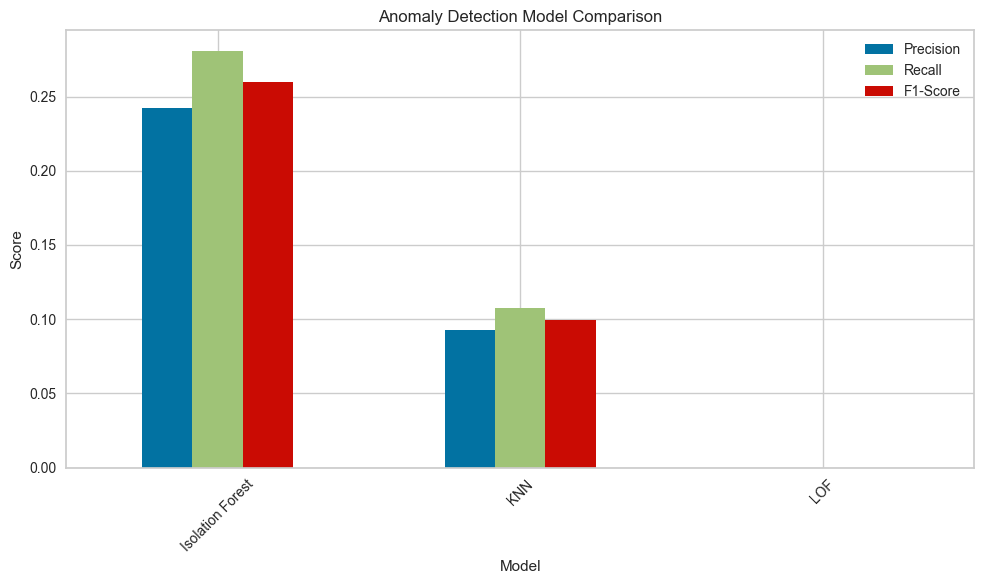

In [15]:
# Compare all models
comparison_df = pd.DataFrame({
    'Model': ['Isolation Forest', 'KNN', 'LOF'],
    'Precision': [iforest_metrics['precision'], knn_metrics['precision'], lof_metrics['precision']],
    'Recall': [iforest_metrics['recall'], knn_metrics['recall'], lof_metrics['recall']],
    'F1-Score': [iforest_metrics['f1'], knn_metrics['f1'], lof_metrics['f1']]
})

print("\nModel Comparison:")
print(comparison_df.to_string(index=False))

# Plot comparison
import matplotlib.pyplot as plt

comparison_df.set_index('Model')[['Precision', 'Recall', 'F1-Score']].plot(kind='bar', figsize=(10, 6))
plt.title('Anomaly Detection Model Comparison')
plt.ylabel('Score')
plt.xlabel('Model')
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

## Save Best Model

Save the best performing model for future use.

In [16]:
# Determine best model based on F1-score
best_idx = comparison_df['F1-Score'].idxmax()
best_model_name = comparison_df.loc[best_idx, 'Model']

print(f"Best model: {best_model_name}")

# Select best model
if best_model_name == 'Isolation Forest':
    best_model = iforest
elif best_model_name == 'KNN':
    best_model = knn
else:
    best_model = lof

# Create output directory if it doesn't exist
from pathlib import Path
output_dir = Path('../outputs/anomaly')
output_dir.mkdir(parents=True, exist_ok=True)

# Save the model
save_model(best_model, '../outputs/anomaly/anomaly_model')
print(f"\nModel saved to: ../outputs/anomaly/anomaly_model.pkl")

Best model: Isolation Forest
Transformation Pipeline and Model Successfully Saved



Model saved to: ../outputs/anomaly/anomaly_model.pkl

## Conclusion

In this tutorial, we:

1. ✅ Loaded the Credit Card Fraud dataset
2. ✅ Preprocessed data for unsupervised learning
3. ✅ Trained multiple anomaly detection models
4. ✅ Visualized anomalies with TSNE and UMAP
5. ✅ Evaluated models against actual fraud labels
6. ✅ Compared model performance
7. ✅ Saved the best model

### Key Takeaways

- **Isolation Forest** typically performs well on high-dimensional data
- **KNN** is sensitive to distance metrics and scaling
- **LOF** works well when anomalies have different densities
- The `fraction` parameter controls the expected proportion of anomalies
- PyCaret makes anomaly detection simple with just a few lines of code

### Next Steps

- Try adjusting the `fraction` parameter for each model
- Experiment with feature engineering
- Test on new transaction data
- Deploy the model for real-time fraud detection